In [1]:
import os
import torch
import cv2
import numpy as np
import torchvision
from torch.utils.data import Dataset, DataLoader
from torchvision.models.detection import fasterrcnn_resnet50_fpn
import torchvision.transforms as T

# Define dataset class
class CustomObjectDetectionDataset(Dataset):
    def __init__(self, img_folder, label_folder, transform=None):
        self.img_folder = img_folder
        self.label_folder = label_folder
        self.transform = transform
        self.image_files = [f for f in os.listdir(img_folder) if f.endswith(('.jpg', '.png'))]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.img_folder, img_name)
        label_path = os.path.join(self.label_folder, os.path.splitext(img_name)[0] + ".txt")

        # Load image
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        height, width, _ = image.shape

        # Load annotations
        boxes = []
        labels = []
        with open(label_path, "r") as f:
            for line in f.readlines():
                data = list(map(float, line.strip().split()))
                class_id, x_center, y_center, w, h = data
                x_min = (x_center - w / 2) * width
                y_min = (y_center - h / 2) * height
                x_max = (x_center + w / 2) * width
                y_max = (y_center + h / 2) * height
                boxes.append([x_min, y_min, x_max, y_max])
                labels.append(int(class_id) + 1)  # Class IDs should be >=1

        # Convert to tensors
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        image = T.ToTensor()(image)

        target = {"boxes": boxes, "labels": labels}

        return image, target

# Define paths
img_folder = "/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/train/images"
label_folder = "/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/train/labels"

# Create dataset and dataloader
dataset = CustomObjectDetectionDataset(img_folder, label_folder)
dataloader = DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

# Load pre-trained Faster R-CNN model
model = fasterrcnn_resnet50_fpn(pretrained=True)
num_classes = 2  # Modify based on number of object classes + 1 (background)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

# Training setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)



/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 183MB/s]  


In [2]:

# Training loop
num_epochs = 5
for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    for images, targets in dataloader:
        images = list(img.to(device) for img in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        optimizer.zero_grad()
        loss_dict = model(images, targets)
        loss = sum(loss for loss in loss_dict.values())
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()
    
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}")

# Save trained model
torch.save(model.state_dict(), "object_detection_model.pth")

Epoch 1/5, Loss: 118.6578
Epoch 2/5, Loss: 90.3199
Epoch 3/5, Loss: 79.1207
Epoch 4/5, Loss: 72.2925
Epoch 5/5, Loss: 63.9798


In [3]:
from torchvision.ops.boxes import box_iou

def evaluate_model(model, dataloader, iou_threshold=0.5):
    model.eval()
    total_true = 0
    total_detected = 0
    correct_detections = 0

    with torch.no_grad():
        for images, targets in dataloader:
            images = [img.to(device) for img in images]
            outputs = model(images)

            for i in range(len(images)):
                true_boxes = targets[i]['boxes'].to(device)
                pred_boxes = outputs[i]['boxes'].to(device)
                pred_scores = outputs[i]['scores'].to(device)

                # Apply confidence threshold
                keep = pred_scores > 0.5  # Keep predictions with confidence > 50%
                pred_boxes = pred_boxes[keep]

                total_true += len(true_boxes)
                total_detected += len(pred_boxes)

                # Compute IoU
                if len(pred_boxes) > 0 and len(true_boxes) > 0:
                    ious = box_iou(pred_boxes, true_boxes)
                    max_ious, _ = ious.max(dim=1)
                    correct_detections += (max_ious >= iou_threshold).sum().item()

    precision = correct_detections / total_detected if total_detected > 0 else 0
    recall = correct_detections / total_true if total_true > 0 else 0
    f1_score = (2 * precision * recall) / (precision + recall + 1e-6)

    print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1_score:.4f}")

# Run evaluation after training
evaluate_model(model, dataloader)


Precision: 0.8635, Recall: 0.9939, F1-score: 0.9242


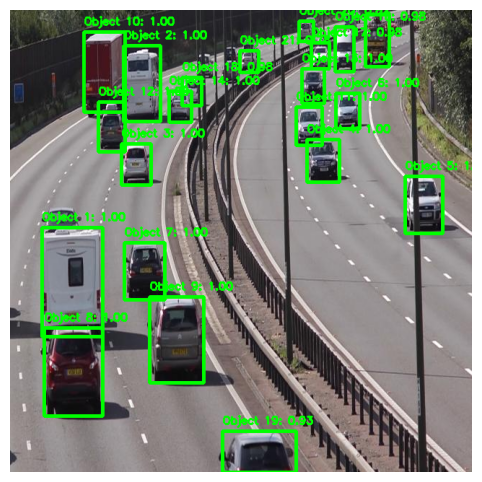

In [4]:
import torch
import torchvision.transforms as T
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Define transformation for the input image
transform = T.Compose([T.ToTensor()])

# Function to perform object detection on an uploaded image
def detect_objects(image_path, model, score_threshold=0.5):
    model.eval()
    
    # Load and preprocess image
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension
    
    with torch.no_grad():
        output = model(image_tensor)[0]  # Get predictions for the first image

    # Extract bounding boxes, labels, and confidence scores
    boxes = output["boxes"].cpu().numpy()
    scores = output["scores"].cpu().numpy()

    # Load image with OpenCV for visualization
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Draw bounding boxes on the image
    for i, box in enumerate(boxes):
        if scores[i] > score_threshold:  # Only draw boxes for confident predictions
            x1, y1, x2, y2 = map(int, box)
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 3)  # Green box
            label = f"Object {i+1}: {scores[i]:.2f}"
            cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Display the image with bounding boxes
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# Example Usage
image_path = "/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/train/images/10_mp4-10_jpg.rf.b87509668caff369c5501325477e6d9a.jpg"  # Replace with the path to your uploaded image
detect_objects(image_path, model)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:00<00:00, 191MB/s]  


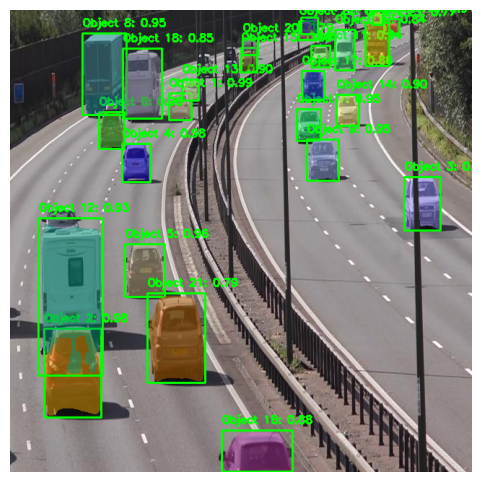

In [5]:
import torchvision
import torchvision.transforms as T
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Load a pre-trained Mask R-CNN model (or use your trained model)
model_segmentation = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
model_segmentation.to(device)
model_segmentation.eval()

# Transformation for input image
transform = T.Compose([T.ToTensor()])

# Function to perform image segmentation
def segment_objects(image_path, model, score_threshold=0.5):
    model.eval()
    
    # Load and preprocess image
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(image_tensor)[0]

    # Extract masks, bounding boxes, and confidence scores
    masks = output["masks"].cpu().numpy()  # (N, 1, H, W)
    boxes = output["boxes"].cpu().numpy()
    scores = output["scores"].cpu().numpy()

    # Convert image to OpenCV format
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    for i, box in enumerate(boxes):
        if scores[i] > score_threshold:
            x1, y1, x2, y2 = map(int, box)
            mask = masks[i, 0]  # Get the mask for the object
            mask = (mask > 0.5).astype(np.uint8) * 255  # Threshold mask to binary

            # Overlay the mask on the image
            color = np.random.randint(0, 255, (3,), dtype=np.uint8)  # Random color
            img[mask > 0] = img[mask > 0] * 0.5 + color * 0.5  # Blend mask with image

            # Draw bounding box
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            label = f"Object {i+1}: {scores[i]:.2f}"
            cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Display the segmented image
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# Example Usage
image_path = "/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/train/images/10_mp4-10_jpg.rf.b87509668caff369c5501325477e6d9a.jpg"  # Replace with your image file
segment_objects(image_path, model_segmentation)


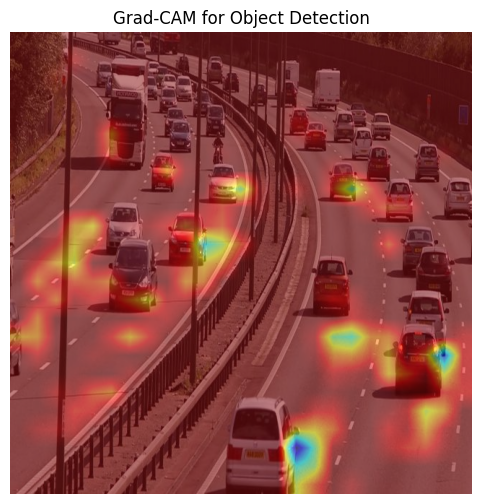

In [10]:
import torch
import torchvision
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms

# Set device (use GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load a pre-trained Mask R-CNN model
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
model.to(device)
model.eval()

# Define the path to your image
image_path = "/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/train/images/10_mp4-30_jpg.rf.73eafea5e7f73f941543d3dcbe68afe4.jpg"  # Replace with your actual image path

# Define image preprocessing
transform = transforms.Compose([
    transforms.ToTensor(),
])

# Load and preprocess the image
image = Image.open(image_path).convert("RGB")
image_tensor = transform(image).unsqueeze(0).to(device)

# Select the target layer for Grad-CAM (last convolutional layer)
target_layer = model.backbone.body.layer4[-1]

# Define Grad-CAM class
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Register hooks
        target_layer.register_forward_hook(self.save_activations)
        target_layer.register_backward_hook(self.save_gradients)

    def save_activations(self, module, input, output):
        self.activations = output.detach()

    def save_gradients(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate_heatmap(self, class_idx):
        # Move gradients and activations to GPU if necessary
        weights = torch.mean(self.gradients, dim=[2, 3]).to(device)  # Move to GPU
        cam = torch.zeros(self.activations.shape[2:], dtype=torch.float32, device=device)  # Move to GPU

        for i, w in enumerate(weights[0]):
            cam += w * self.activations[0, i, :, :]

        cam = cam.cpu().numpy()  # Move back to CPU for visualization
        cam = np.maximum(cam, 0)  # Apply ReLU
        cam = cv2.resize(cam, (image_tensor.shape[3], image_tensor.shape[2]))  # Resize to image size
        cam = (cam - cam.min()) / (cam.max() - cam.min())  # Normalize

        return cam

# Initialize Grad-CAM
grad_cam = GradCAM(model, target_layer)

# Forward pass
output = model(image_tensor)

# Select the first detected object
class_idx = 0  # Change if needed

# Backpropagate
model.zero_grad()
output[0]['scores'][class_idx].backward(retain_graph=True)

# Generate Grad-CAM heatmap
heatmap = grad_cam.generate_heatmap(class_idx)

# Overlay heatmap on the original image
heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
image_np = np.array(image)
overlay = cv2.addWeighted(image_np, 0.5, heatmap, 0.5, 0)

# Display image
plt.figure(figsize=(10, 6))
plt.imshow(overlay)
plt.axis("off")
plt.title("Grad-CAM for Object Detection")
plt.show()


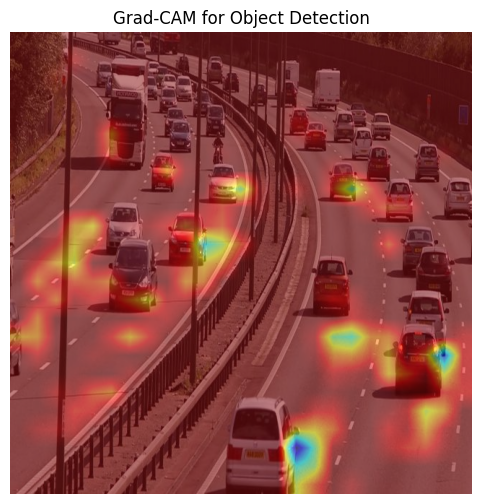

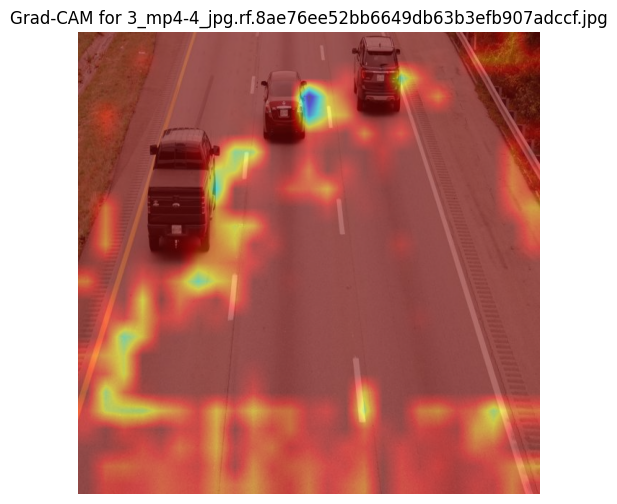

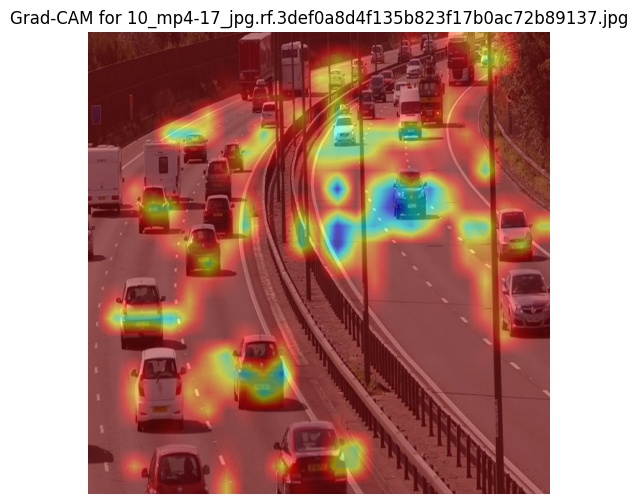

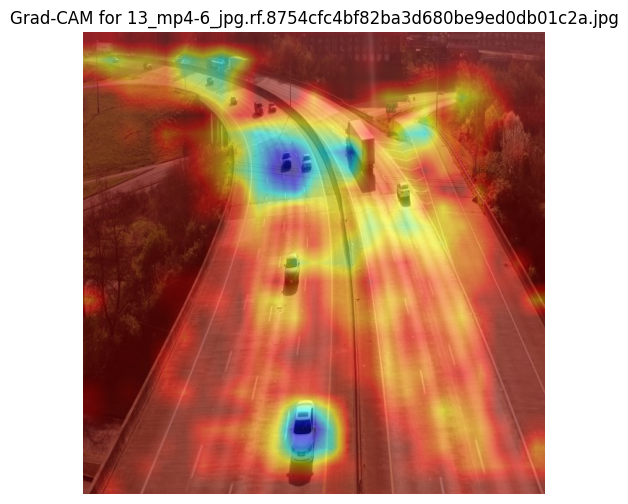

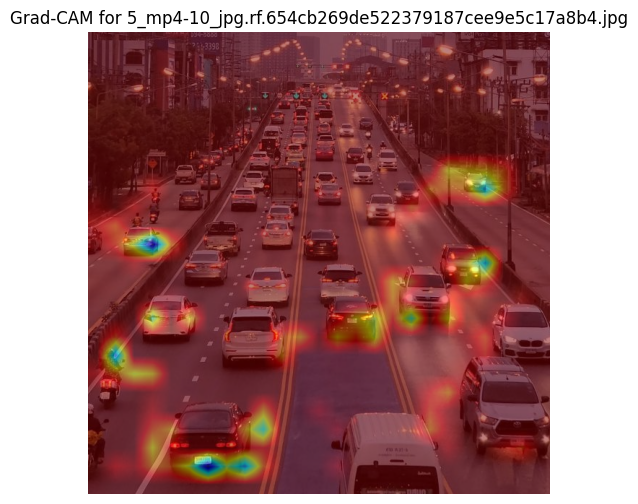

...

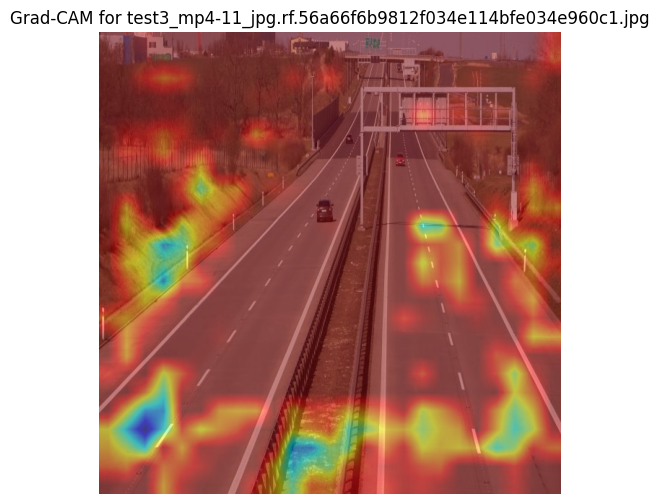

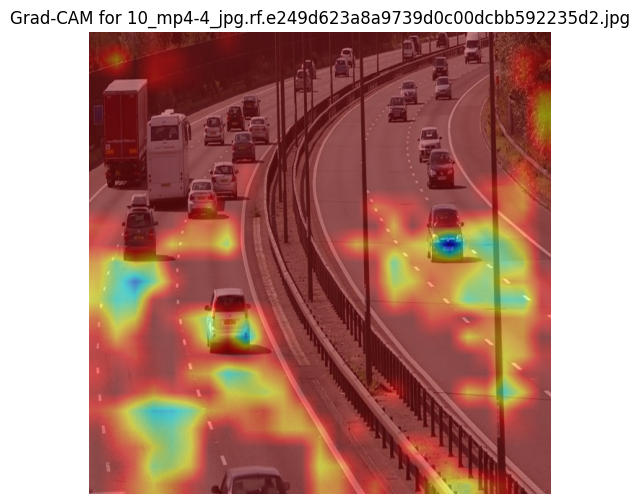

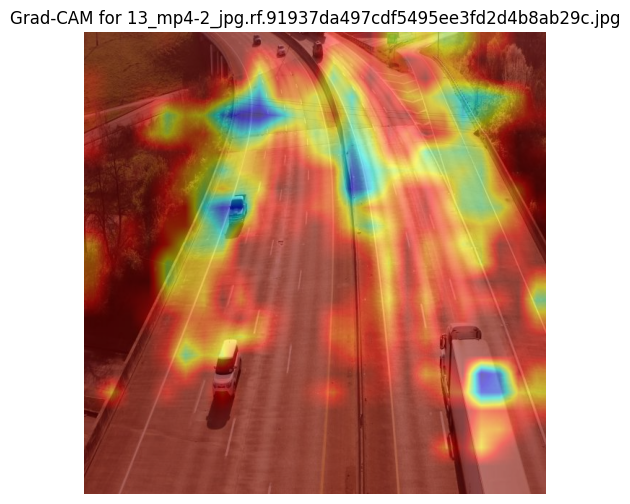

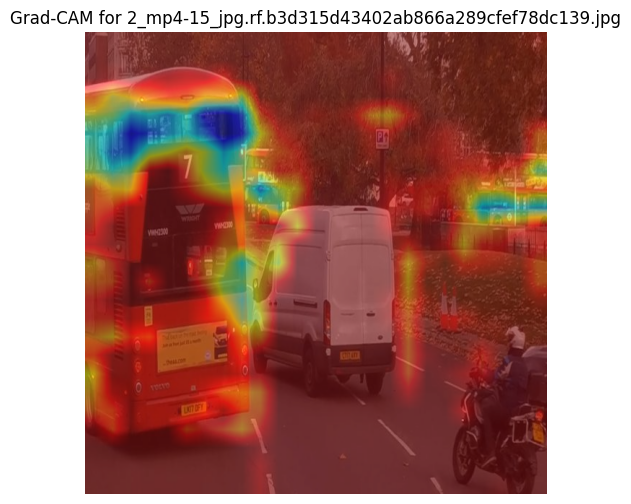

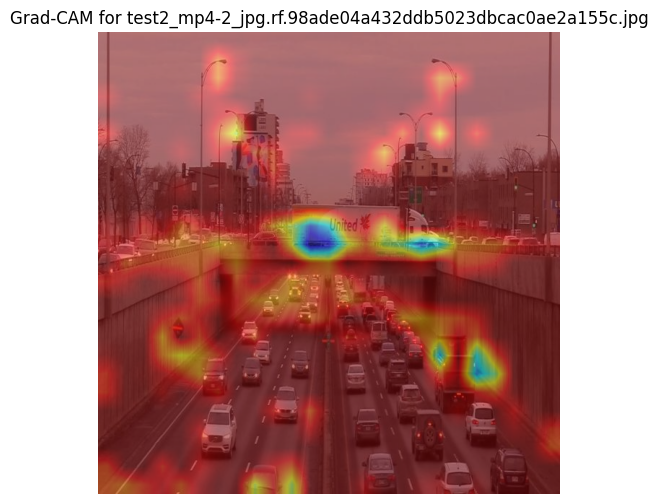

In [ ]:
import torch
import torchvision
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms
import os

# Set device (use GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load a pre-trained Mask R-CNN model
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
model.to(device)
model.eval()

# Define the path to your image or dataset
image_path = "/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/train/images/10_mp4-30_jpg.rf.73eafea5e7f73f941543d3dcbe68afe4.jpg"  # Replace with the actual image path

# Define image preprocessing
transform = transforms.Compose([
    transforms.ToTensor(),
])

# Load and preprocess the image
image = Image.open(image_path).convert("RGB")
image_tensor = transform(image).unsqueeze(0).to(device)

# Select the target layer for Grad-CAM (last convolutional layer)
target_layer = model.backbone.body.layer4[-1]

# Define Grad-CAM class
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None

        # Register hooks
        self.target_layer.register_forward_hook(self.save_activation)
        self.target_layer.register_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output

    def save_gradient(self, module, grad_in, grad_out):
        self.gradients = grad_out[0]

    def generate_heatmap(self, class_idx):
        weights = torch.mean(self.gradients, dim=[2, 3]).to(device)  # Move to GPU
        cam = torch.zeros(self.activations.shape[2:], dtype=torch.float32, device=device)  # Move to GPU

        for i, w in enumerate(weights[0]):
            cam += w * self.activations[0, i, :, :]

        cam = cam.detach().cpu().numpy()  # Detach and move to CPU for visualization
        cam = np.maximum(cam, 0)  # Apply ReLU
        cam = cv2.resize(cam, (image_tensor.shape[3], image_tensor.shape[2]))  # Resize to image size
        cam = (cam - cam.min()) / (cam.max() - cam.min())  # Normalize

        return cam

# Initialize Grad-CAM
grad_cam = GradCAM(model, target_layer)

# Forward pass
output = model(image_tensor)

# Select the first detected object
class_idx = 0  # Change if needed

# Backpropagate
model.zero_grad()
output[0]['scores'][class_idx].backward(retain_graph=True)

# Generate Grad-CAM heatmap
heatmap = grad_cam.generate_heatmap(class_idx)

# Overlay heatmap on the original image
heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
image_np = np.array(image)
overlay = cv2.addWeighted(image_np, 0.5, heatmap, 0.5, 0)

# Display image
plt.figure(figsize=(10, 6))
plt.imshow(overlay)
plt.axis("off")
plt.title("Grad-CAM for Object Detection")
plt.show()

# Optionally, if using a dataset, iterate over all images in a folder
dataset_path = "/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/train/images"  # Replace with the path to your dataset

for image_name in os.listdir(dataset_path):
    image_path = os.path.join(dataset_path, image_name)
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image).unsqueeze(0).to(device)

    # Forward pass
    output = model(image_tensor)

    # Backpropagate and generate Grad-CAM heatmap
    model.zero_grad()
    output[0]['scores'][class_idx].backward(retain_graph=True)
    heatmap = grad_cam.generate_heatmap(class_idx)

    # Overlay heatmap on the original image
    heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    image_np = np.array(image)
    overlay = cv2.addWeighted(image_np, 0.5, heatmap, 0.5, 0)

    # Display image
    plt.figure(figsize=(10, 6))
    plt.imshow(overlay)
    plt.axis("off")
    plt.title(f"Grad-CAM for {image_name}")
    plt.show()
